In [1]:
import sys
sys.path.append("N:/Will's CODEX pipeline/")#where pipeline are saved
import os
import glob
import csv

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

import HFcluster
import Split
import CellNeighborhood

# color palette file
xkcd_cols = pd.read_csv("N:/Will's CODEX pipeline/xkcd_hexcol.csv").columns.values #custom color map

# Setup
'''
FILE STRUCTURE USES THE AKOYA PROCESSOR STUCTURE AS DEFAULT

CODEX expression matrices (csvs) should be saved in such a file structure:
path -> runs *should be a list of folder names* -> subdirectory structure (subdir) -> csv files for each region

All csvs with the pattern set in filename_pattern will be read
'''

In [5]:
#input data location (parent folder for individual runs)
path = 'N:/CODEX processed/'

#load multiple CODEX runs (each run data should be in individual folders with regions within)
runs = ['20191028_run18_preveh2_20200416'] #loads runs in a list: written as ['run1 folder name', 'run2 folder name']
#runs = pd.read_csv('N:/CODEX analysis/runs8_19CV.csv').columns.values #loads runs from a csv: folder names of runs in the first row

#subdirectory locations of csv files 
subdir = "/processed/segm/segm-1/fcs/compensated/" #default is Akoya CODEX processor output location; use "" if csvs are not in subfolders
filename_pattern = '*reg*fib*loose.csv' #filename formate of csv files; used * as wildcards 

#output directory
outdir = 'N:/CODEX analysis/0.3Run18_example/' #where to save output heatmaps and csvs

#column names of X, Y, Z coordinates
X = 'x:x'
Y = 'y:y'
Z = 'z:z'

#data filtering
RemoveHighBlankCells = 1 #Boolean 0 for off; 1 for on removes autofluorescent cells *cells with signal in blank channels
DNAfilter = 1 #Boolean 0 for off; 1 for on
DNAChannel = 'cyc002_ch001:HOECHST' #DNA channel name
ManualDNAthreshold = 750
DRAQ5Channel = 'cyc018_ch004:DRAQ5_interior' #DRAQ5 channel name
Zremoval = 0 #Boolean 0 for off; 1 for on
Zfilter = [1,5] #Range of slices to keep
Confidence = 10 #Lower is more stringent (4 is pretty good, 10 captures more weaker staining)

#Markers used for clustering this contain based matching
'''
Copy list of markers and use # to comment out channels that should not be used for clustering
'''
IncludeList=[
    'F4/80_border',
    'Itga7_border',
    'ki67_interior',
    'B220_border',
    'Pax7_interior',
    'CD45_border',
    'CD3_border',
    'F1.652_border',
    'CD4_border',
    'CD8a_border',
    'Myod_interior',
    'Myod_border',
#    'fMyHC',
    'ERTR7_border',
    'Ly6G_border',
    'CD11c_border',
    '16/32_border',
    'Myog_interior',
    'msIgM_border',
    'MHCII_border',
    'CD29_border',
#    'GFAP',
#    'p-H3_interior',
    'CD11b_border',
#    'sMyHC',
    'CD31_border',
#    'CD115',
    'Ter119_border',
#    'NKp46',
#    'Irf8',
#    'Laminin'
    'Mandra1_border',
    'Pdgfra_border',
    'Tenomodulin_border',
    'CD38_border',
    'CD163_border',
    'CD9_border',
    'CD90_border',
#    'Foxp3',
#    'Flt3',
    'CD47_border',
    'N3.36_border',
    'Sca1_border'
    ]

In [6]:
HFcluster.newDir(outdir)
HFcluster.loadState(outdir)

In [7]:
data, data_all = HFcluster.loadData(runs, path, subdir, filename_pattern, Z, RemoveHighBlankCells, DNAfilter, DNAChannel, ManualDNAthreshold, DRAQ5Channel, Zremoval, Zfilter)

Loading 20191028_run18_preveh2_20200416
['20191028_run18_preveh2_reg001_fib_us3.0_grow0x2.5b2.0_loose.csv', '20191028_run18_preveh2_reg002_fib_us3.0_grow0x2.5b2.0_loose.csv', '20191028_run18_preveh2_reg003_fib_us3.0_grow0x2.5b2.0_loose.csv', '20191028_run18_preveh2_reg004_fib_us3.0_grow0x2.5b2.0_loose.csv', '20191028_run18_preveh2_reg005_fib_us3.0_grow0x2.5b2.0_loose.csv']
136999 events found in run 20191028_run18_preveh2_20200416
Manual DNA threshold applied: 750
77600  events were removed in  20191028_run18_preveh2_20200416   59399  events remain
59399 events for clustering


#plot DNA (hoescht vs DRAQ5) biaxial plot
ax = sns.scatterplot(data=data_all.sample(n=10000, axis=0), x=DNAChannel, y=DRAQ5Channel, alpha=0.2)
#ax.set_xscale('log')
#ax.set_yscale('log')
#ax.set_ylim(0,10000)
#ax.set_xlim(0,10000)

In [8]:
data_remax = [HFcluster.rescale(i) for i in data]
data_all_remax = pd.concat(data_remax, keys=runs, names=['RunID'])

In [9]:
print(len(data_all_remax))

59399


In [10]:
markers = HFcluster.getMarkersforClustering(data_all, IncludeList)

33 markers used for clustering


In [11]:
highconf = HFcluster.find_highconf_normalized(data_all_remax, markers, Confidence) #Confidence conveys the sensitivity of elbow finder *lower is more stringent*

Automatic thresholding for high confidence cells...
cyc002_ch004:ki67_interior 298.1153746079132
cyc003_ch003:Pax7_interior 594.8348327950156
cyc005_ch003:Myod_interior 692.7287682300107
cyc007_ch003:MyoG_interior 752.2218872026651
cyc002_ch002:F4/80_border 810.3289435123298
cyc002_ch003:Itga7_border 695.9288217730578
cyc003_ch002:B220_border 230.24414116188325
cyc003_ch004:CD45_border 1364.8573738142636
cyc004_ch002:CD3_border 241.0261898372672
cyc004_ch003:F1.652_border 384.92227189289673
cyc004_ch004:CD4_border 808.127433778385
cyc005_ch002:CD8a_border 703.3734681969659
cyc005_ch003:Myod_border 570.255489155021
cyc006_ch002:ERTR7_border 1549.5702825830315
cyc006_ch003:Ly6G_border 245.84913010936023
cyc006_ch004:CD11c_border 350.9753511884041
cyc007_ch002:16/32_border 1172.405997923837
cyc007_ch004:MsIgM_border 262.7963138173217
cyc008_ch002:MHCII_border 735.0633402224935
cyc008_ch003:CD29_border 823.6768858681942
cyc009_ch003:CD11b_border 554.5085981639098
cyc010_ch002:CD31_border 7

extracting highly variable genes
    finished (0:00:00)


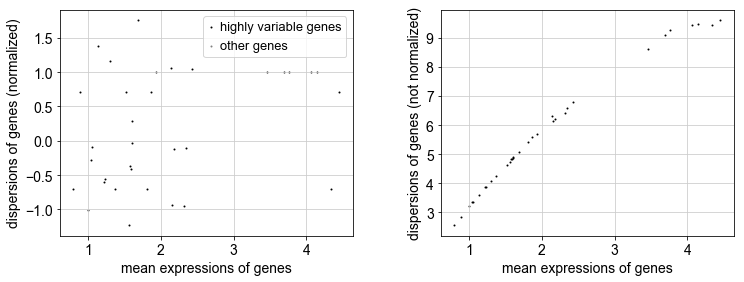

computing PCA with n_comps = 25
computing PCA on highly variable genes
    finished (0:00:00)


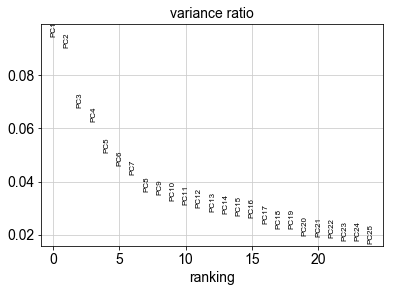

computing neighbors
    using data matrix X directly
    finished (0:00:34)
computing UMAP
    finished (0:01:59)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:15)


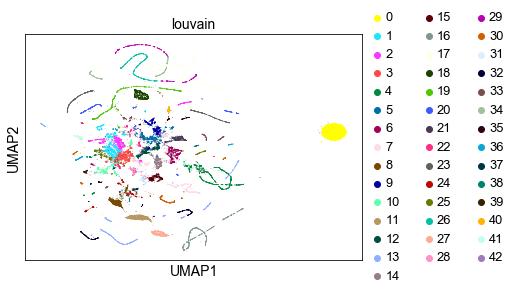

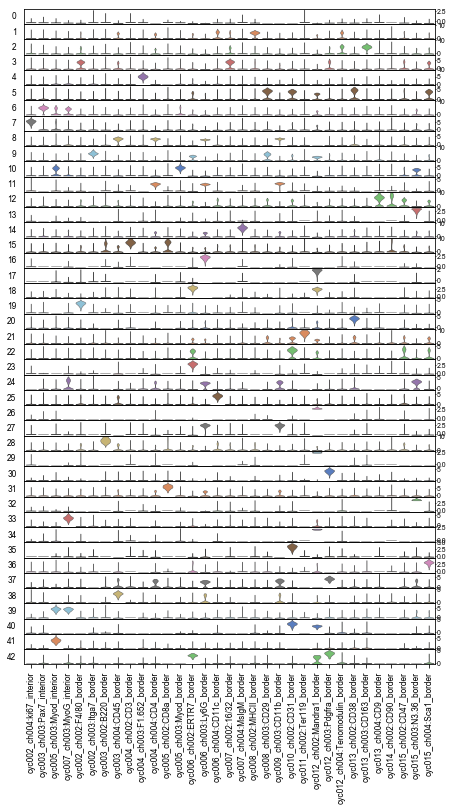

In [12]:
umap_params = HFcluster.setParams(min_dist=0.1)
louvain = HFcluster.scluster(highconf, markers, verbose=2, n_neighbors=45, pcs=15, louvain_res=1, umap_params=umap_params)

In [13]:
data_all['Louvain'] = louvain

In [14]:
HFcluster.saveState(outdir)

In [15]:
print('{} % of cells labeled'.format((1-len(data_all.loc[data_all.Louvain=='0'])/len(data_all))*100))

69.96750787050287 % of cells labeled


In [16]:
#Propagate labels using non-noise suppressed data
output_labels = HFcluster.propagateLabels(data_all_remax, markers, louvain)
data_all['ClusterID'] = output_labels.values #label propagated data saved as ClusterID column

In [17]:
data_all['ClusterID'] = output_labels.values

In [18]:
HFcluster.saveState(outdir)

Estimated merge distance is 0.1799728187642874


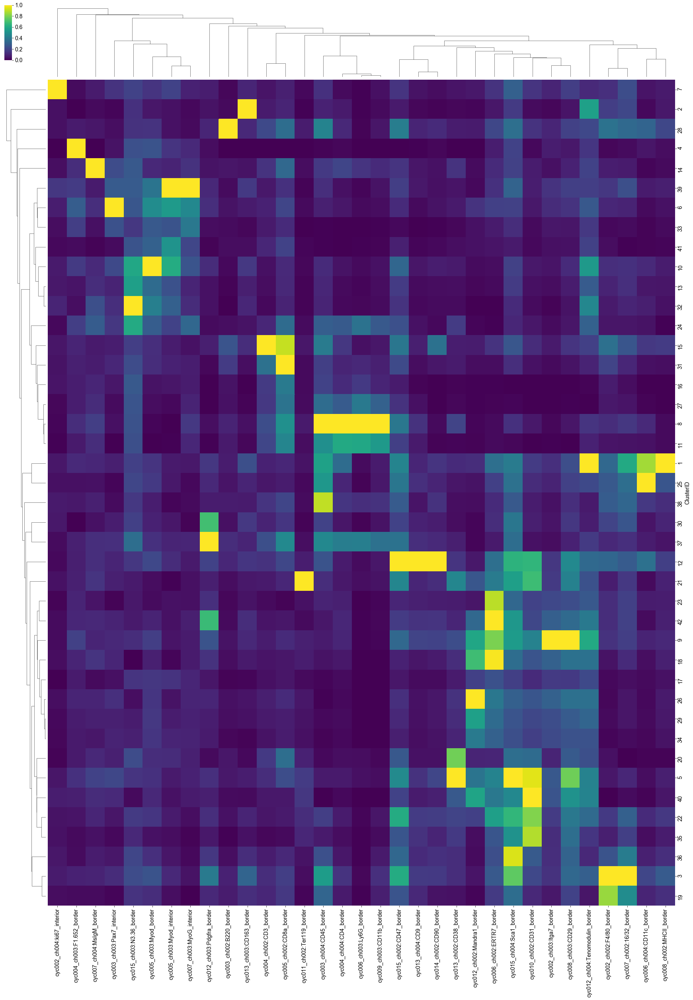

In [19]:
g, suggested_cutoff = HFcluster.ClusterMeansHeatmap(data_all, 'ClusterID', markers, save=False, outdir=outdir, estimate_dist=True, figsize=(30, 40))

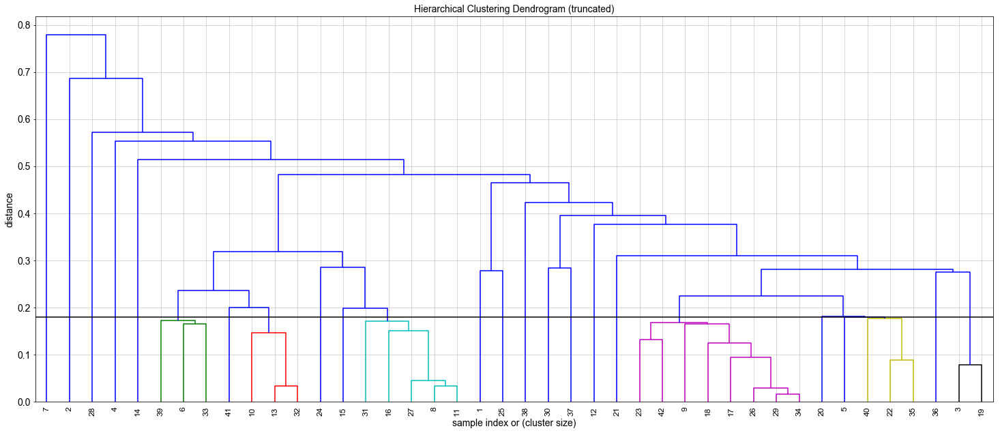

In [20]:
# Hierachrical cluster merging
merged_labels = HFcluster.hierach_merge(data_all, g, 'distance', suggested_cutoff, output_labels)
data_all['mergedID'] = merged_labels #merged cluster data saved as mergedID column

In [21]:
# Cluster size counts
data_all['mergedID'].value_counts()

11    9139
4     7011
22    6402
2     4694
20    4524
14    4310
12    3838
1     3106
7     3066
23    2812
13    1437
17    1228
9     1206
8      954
5      862
19     838
6      806
3      685
21     673
16     647
15     470
18     370
10     321
Name: mergedID, dtype: int64

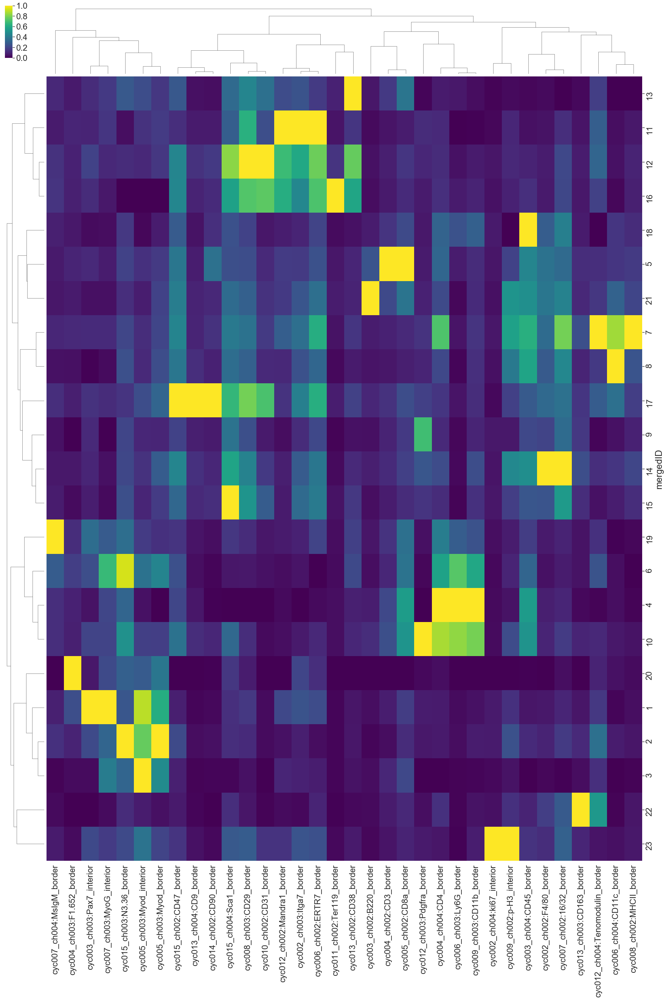

In [22]:
sns.set(font_scale=2)
HFcluster.ClusterMeansHeatmap(data_all, 'mergedID', markers+['cyc009_ch002:p-H3_interior'], save=True, outdir=outdir, metric='correlation', method='complete', estimate_dist=False, figsize=(30, 40))

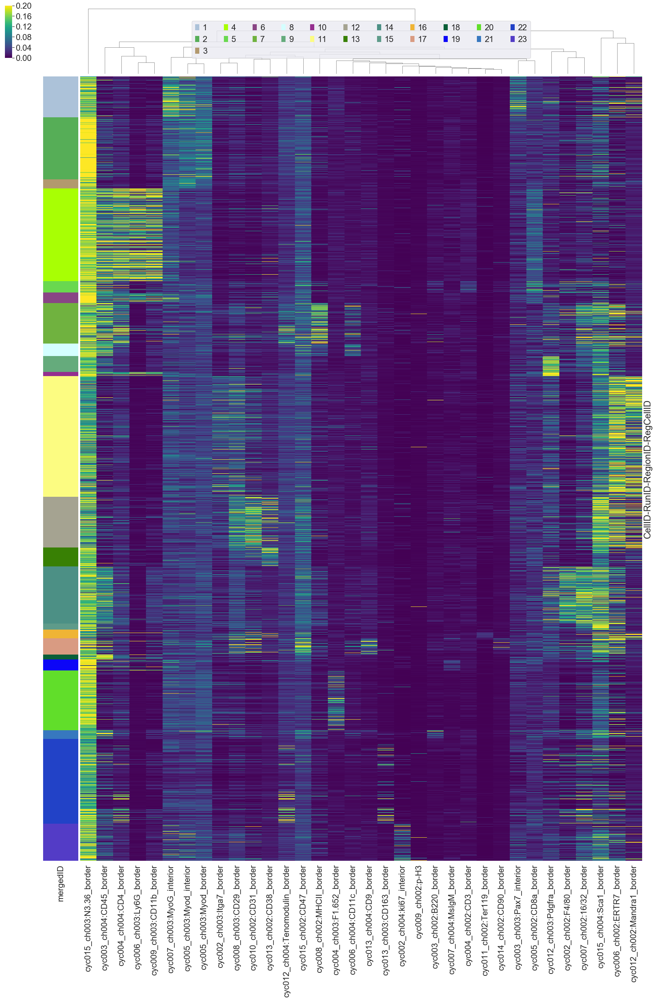

In [24]:
palette = sns.color_palette(xkcd_cols[:len(np.unique(data_all['mergedID'].astype(np.int).values))])
HFcluster.CellExpressionHeatmap(data_all, 'mergedID', markers+['cyc009_ch002:p-H3'], save = True, outdir = outdir, palette = palette, vmax = 0.2, figsize=(30, 40))

In [25]:
HFcluster.saveState(outdir)

Processing tissues: 1/5 : 20191028_run18_preveh2_20200416_1
Processing tissues: 2/5 : 20191028_run18_preveh2_20200416_2
Processing tissues: 3/5 : 20191028_run18_preveh2_20200416_3
Processing tissues: 4/5 : 20191028_run18_preveh2_20200416_4
Processing tissues: 5/5 : 20191028_run18_preveh2_20200416_5


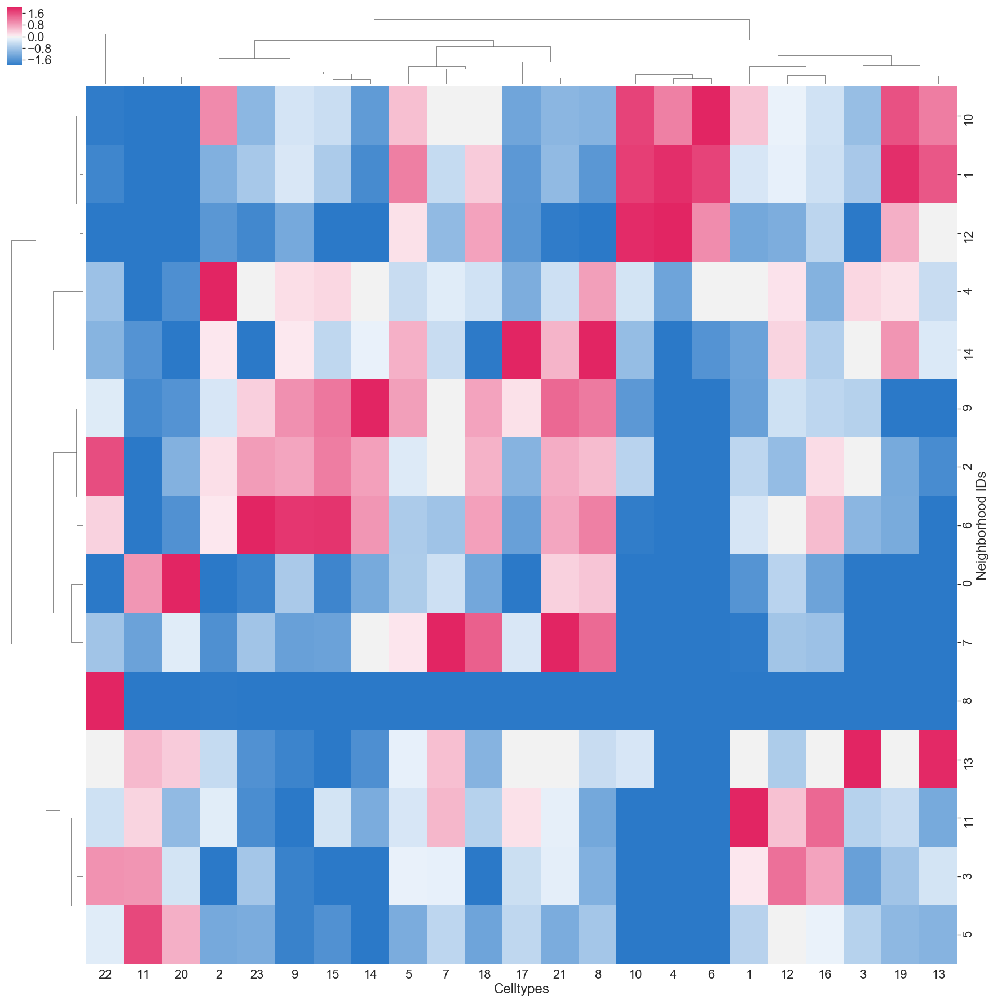

In [26]:
data_all = CellNeighborhood.find(data_all, outdir, cluster_col='mergedID', k=20, n_neighborhoods=15, drop=[])

# Optional: Biaxial gating method to split clusters

In [ ]:
MuSC, sel_idx = Split.plotBiaxial(data_all.loc[data_all['mergedID']==44], 'Myod1_interior','Pax7_interior','Itga7', False)

In [72]:
index = Split.getSelectCells(MuSC, sel_idx)
data_all = Split.newCluster(data_all, 'mergedID', index)

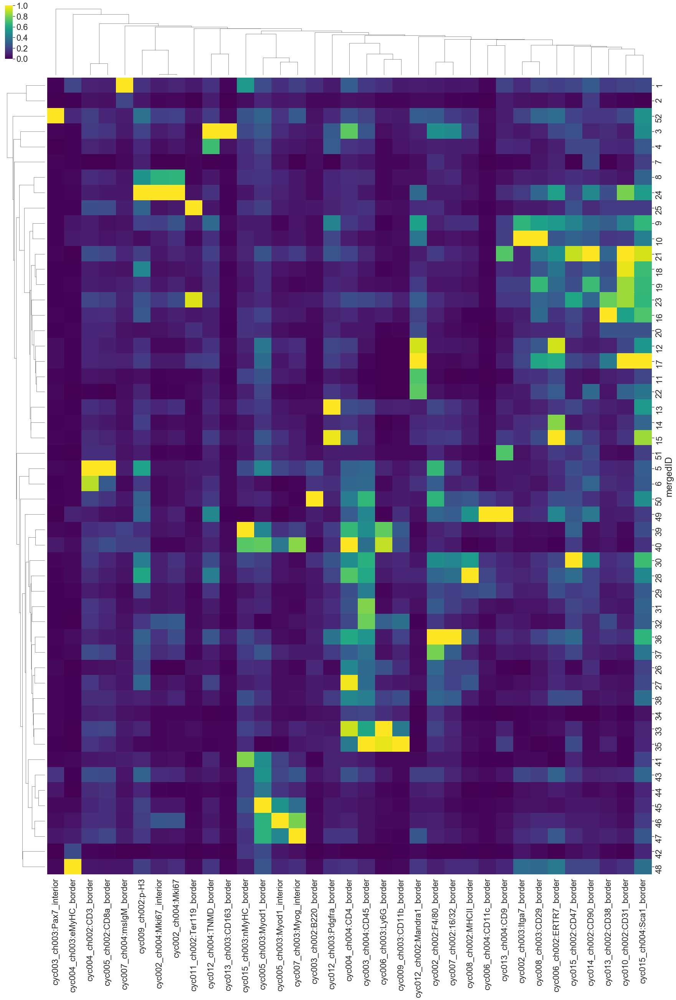

In [73]:
HFcluster.ClusterMeansHeatmap(data_all, 'mergedID', markers+['cyc002_ch004:Mki67','cyc009_ch002:p-H3'], save=True, outdir=outdir, figsize=(30, 40))

# Interactive Tissue Array to visualize clusters

In [28]:
tissuearray = HFcluster.generateTissueArray(data_all, X, Y, shift=10000)

In [29]:
HFcluster.plotlyTissueArray(tissuearray, X, Y, 'mergedID', xkcd_cols[35:])

# Convert Cluster ID to celltype names

In [78]:
data_all = HFcluster.loadCelltypeNames(data_all, outdir, 'mergedID2celltypeNames.csv', 'mergedID')

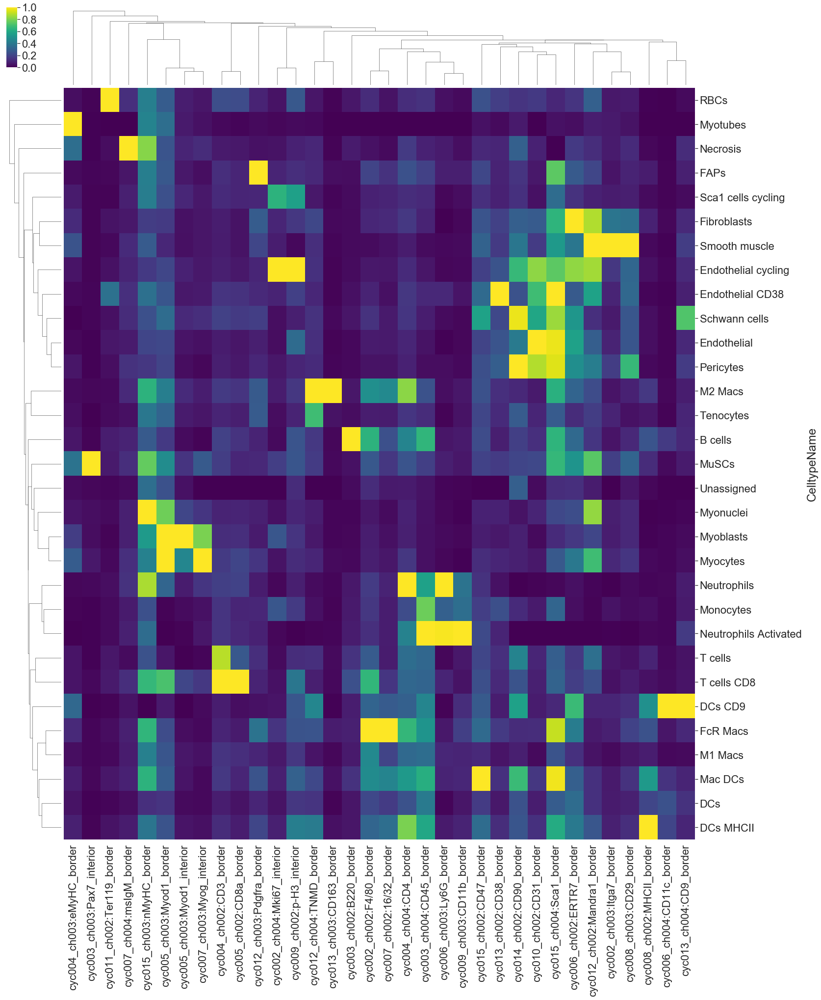

In [80]:
HFcluster.ClusterMeansHeatmap(data_all, 'CelltypeName', markers+['cyc009_ch002:p-H3_interior'], save=True, outdir=outdir, figsize=(25, 30))

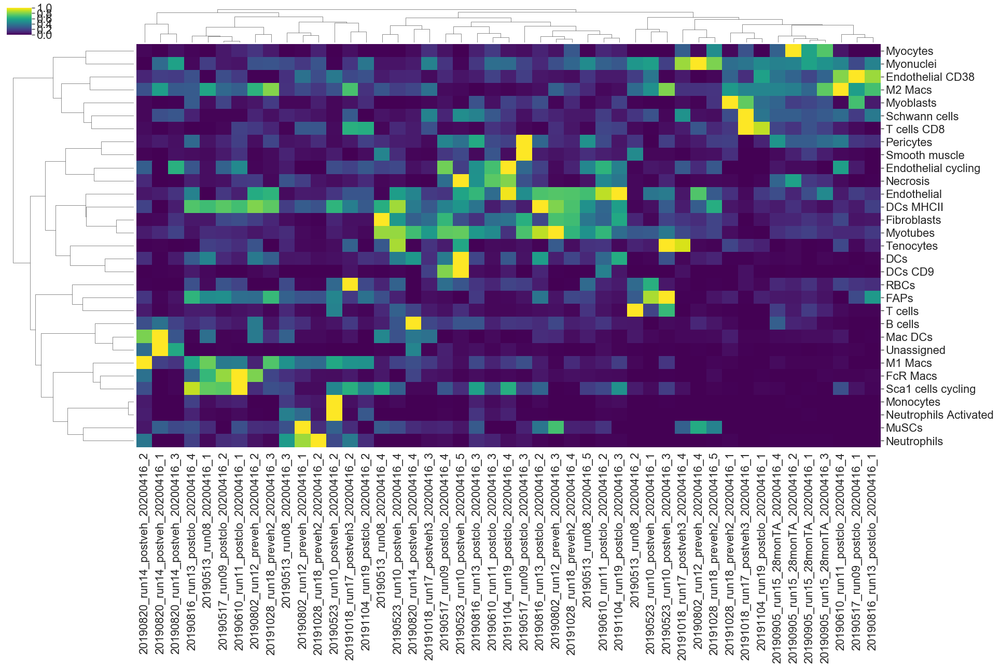

In [110]:
mergedIDcounts = HFcluster.CelltypeCompositionHeatmap(data_all, runs, 'CelltypeName', drop = [], save = True, outdir = outdir, proportions =True, metric='correlation', method='complete', standard_scale= False, figsize=(30,15))

# Interactive plot for Cell Types

In [30]:
tissuearray = HFcluster.generateTissueArray(data_all, X, Y, shift=10000)

In [ ]:
HFcluster.plotlyTissueArray(tissuearray, X, Y, 'CelltypeName', xkcd_cols[25:])

# Cellular Neighborhood Module

Processing tissues: 1/5 : 20191028_run18_preveh2_20200416_1
Processing tissues: 2/5 : 20191028_run18_preveh2_20200416_2
Processing tissues: 3/5 : 20191028_run18_preveh2_20200416_3
Processing tissues: 4/5 : 20191028_run18_preveh2_20200416_4
Processing tissues: 5/5 : 20191028_run18_preveh2_20200416_5


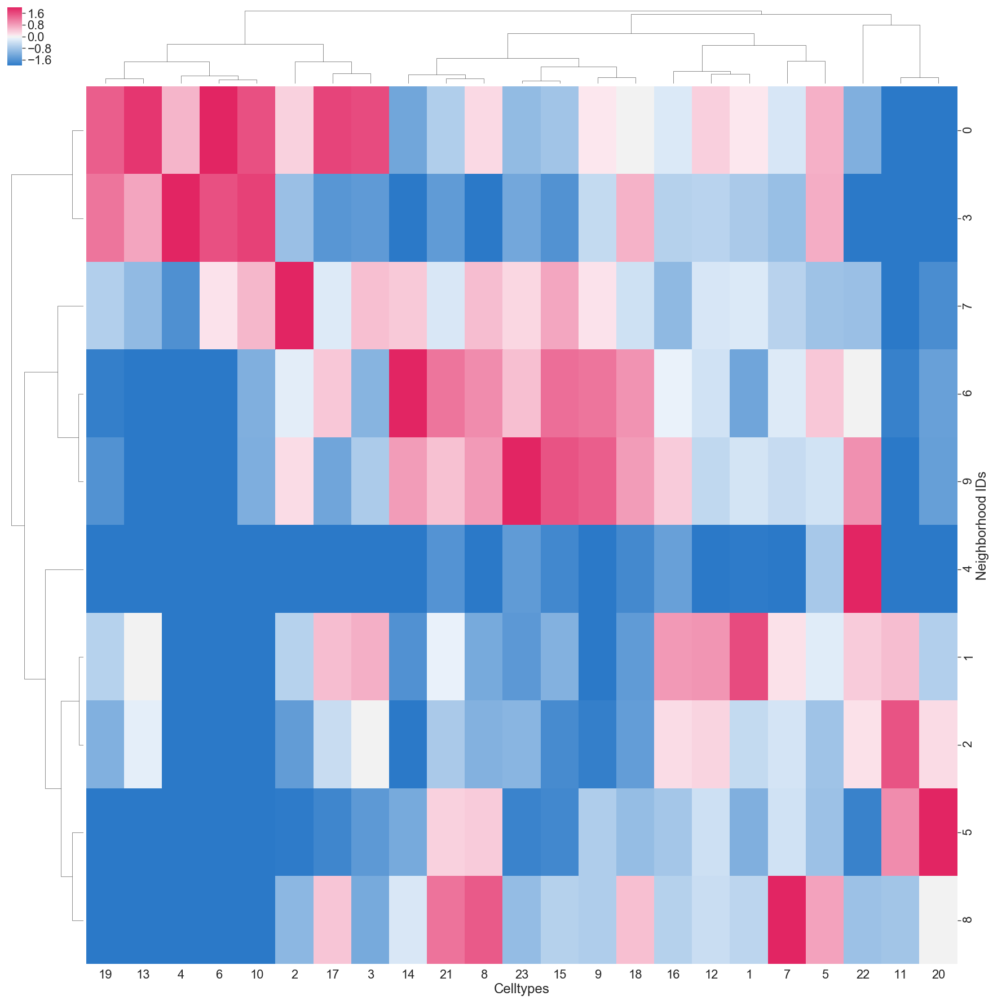

In [33]:
data_all = CellNeighborhood.find(data_all, outdir, cluster_col='mergedID', k=10, n_neighborhoods=10, drop=[])

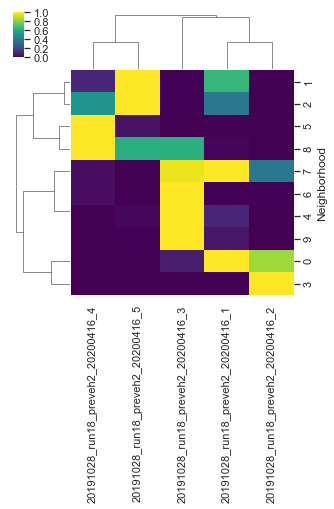

In [36]:
sns.set(font_scale=1)
mergedIDcounts = HFcluster.CelltypeCompositionHeatmap(data_all, runs, 'Neighborhood', drop = [-1], save = True, outdir = outdir, proportions=True, standard_scale= 0, figsize=(5,5))

In [37]:
HFcluster.saveState(outdir)

# Interactive plot for Cellular Neighborhoods

In [38]:
tissuearray = HFcluster.generateTissueArray(data_all, X, Y, shift=10000)

In [39]:
colors = ["lightblue", "gold", "silver", "forestgreen", "darkorange", "crimson", "teal", "lightpink", "lightgreen", "blueviolet"]
HFcluster.plotlyTissueArray(tissuearray, X, Y, 'Neighborhood', colors)

# Export for further analysis

In [40]:
HFcluster.save_as_CSV(data_all, runs, outdir)

Wrote data to '20191028_run18_preveh2_20200416_1_compensated.csv'
Wrote data to '20191028_run18_preveh2_20200416_2_compensated.csv'
Wrote data to '20191028_run18_preveh2_20200416_3_compensated.csv'
Wrote data to '20191028_run18_preveh2_20200416_4_compensated.csv'
Wrote data to '20191028_run18_preveh2_20200416_5_compensated.csv'


In [41]:
HFcluster.save_as_FCS(data_all, runs, outdir)

No CelltypeName column, continuing...
Wrote data to 'reg001_compensated.fcs'
Wrote data to 'reg002_compensated.fcs'
Wrote data to 'reg003_compensated.fcs'
Wrote data to 'reg004_compensated.fcs'
Wrote data to 'reg005_compensated.fcs'
